# Visualization Variant Painting Images and Cells

In [111]:
import os
import glob
import polars as pl
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.io import imread
from tqdm import tqdm
import re
import sys
import subprocess
from plot_utils import *

PLATEMAP_DIR = "../2.snakemake_pipeline/inputs/metadata/platemaps/{batch_id}/platemap"
TIFF_IMGS_DIR = "../1.image_preprocess_qc/inputs/cpg_imgs"
IMG_QC_DIR = "../../../../3_outputs/1_snakemake_pipeline/2.smp_results_analyses/1.image_qc_outputs/{bio_rep}"

## 1. Loading meta data and variant classification

In [118]:
BIO_REP_BATCHES_DICT = {
    "2024_01_Batch_7-8": ("2024_01_23_Batch_7", "2024_02_06_Batch_8"),
    "2024_12_Batch_11-12": ("2024_12_09_Batch_11", "2024_12_09_Batch_12"),
    "2025_03_Batch_15-16": ("2025_03_17_Batch_15", "2025_03_17_Batch_16"),
    "2025_01_Batch_13-14": ("2025_01_27_Batch_13", "2025_01_28_Batch_14")
}

BIO_BATCH_MAP_DICT = {
    "B7": "B_7-8",
    "B8": "B_7-8",
    "B11": "B_11-12",
    "B12": "B_11-12",
    "B13A": "B_13-14",
    "B14A": "B_13-14",
    "B15": "B_15-16",
    "B16": "B_15-16",
}

FEAT_SETS = ["DNA", "Mito", "GFP", "AGP", "Morph"]
OUT_IMG_DIR = f"../2.snakemake_pipeline/outputs/visualize_imgs"
OUT_CELL_DIR = f"../2.snakemake_pipeline/outputs/visualize_cells"
CLASS_RES_OUTDIR = "../../../../3_outputs/1_snakemake_pipeline/2.smp_results_analyses/3.classification_results"

### 1.1 Read in the meta data

In [114]:
allele_meta_df, img_well_qc_sum_df = pl.DataFrame(), pl.DataFrame()
allele_meta_df_dict, img_well_qc_sum_dict, auroc_df_dict = {}, {}, {}

for bio_rep, bio_rep_batches in BIO_REP_BATCHES_DICT.items():
    for batch_id in bio_rep_batches:
        allele_meta_df_batch = pl.DataFrame()
        platemaps = [file for file in os.listdir(PLATEMAP_DIR.format(batch_id=batch_id)) if file.endswith(".txt")]
        for platemap in platemaps:
            platemap_df = pl.read_csv(os.path.join(PLATEMAP_DIR.format(batch_id=batch_id), platemap), separator="\t", infer_schema_length=100000)
            allele_meta_df_batch = pl.concat([allele_meta_df_batch, 
                                        platemap_df.filter((pl.col("node_type").is_not_null()))], # (~pl.col("node_type").is_in(["TC","NC","PC"]))&
                                        how="diagonal_relaxed").sort("plate_map_name")
            allele_meta_df_batch = allele_meta_df_batch.with_columns(pl.col("plate_map_name").alias("plate_map")) ## str.split('_').list.get(0).
        allele_meta_df = pl.concat([
            allele_meta_df,
            allele_meta_df_batch
        ], how="diagonal_relaxed")#.sort("plate_map_name") ## (~pl.col("node_type").is_in(["TC","NC","PC"]))&
    allele_meta_df_dict[bio_rep] = allele_meta_df_batch

    img_well_qc_sum = pl.read_csv(f"{IMG_QC_DIR.format(bio_rep=bio_rep)}/plate-well-level_img_qc_sum.csv")
    img_well_qc_sum_morph = img_well_qc_sum.filter(pl.col("channel")!="GFP")
    img_well_qc_sum_morph = img_well_qc_sum_morph.group_by(["plate","well"]).agg(
        pl.col("is_bg").max().alias("is_bg"),
        pl.col("s2n_ratio").mean().alias("s2n_ratio"),
        pl.col("median_plate").mean().alias("median_plate"),
    ).with_columns(pl.lit("Morph").alias("channel"))
    img_well_qc_sum = pl.concat([
        img_well_qc_sum.select(pl.col(["plate","well","channel","median_plate","is_bg","s2n_ratio"])),
        img_well_qc_sum_morph.select(pl.col(["plate","well","channel","median_plate","is_bg","s2n_ratio"])),
    ], how="vertical_relaxed")
    
    img_well_qc_sum_df = pl.concat(
        [img_well_qc_sum_df, img_well_qc_sum],
        how="diagonal_relaxed"
    )
    img_well_qc_sum_dict[bio_rep] = img_well_qc_sum

    auroc_df_dict[bio_rep] = {}
    for feat in FEAT_SETS:
        auroc_df = pl.read_csv(f"{CLASS_RES_OUTDIR}/{bio_rep}/altered_{feat}_summary_auroc.csv")
        auroc_df_dict[bio_rep][feat] = auroc_df

In [4]:
auroc_df_dict["2024_01_Batch_7-8"]["GFP"].filter(pl.col("Altered_GFP_99_both_batches"))

allele_0,Altered_GFP_95_batch8,Altered_GFP_95_batch7,Altered_GFP_95_both_batches,Altered_GFP_99_batch8,Altered_GFP_99_batch7,Altered_GFP_99_both_batches,AUROC_batch8,AUROC_batch7,AUROC_Mean
str,i64,i64,bool,i64,i64,bool,f64,f64,f64
"""AIPL1_Met79Thr""",1,1,true,1,1,true,0.994026,0.995972,0.994999
"""HPRT1_Leu41Pro""",1,1,true,1,1,true,0.993009,0.996809,0.994909
"""RNF135_Arg286His""",1,1,true,1,1,true,0.992535,0.998383,0.995459
"""PMP22_Leu80Pro""",1,1,true,1,1,true,0.997455,0.999002,0.998229
"""IL2RG_Ser108Pro""",1,1,true,1,1,true,0.985685,0.984638,0.985161
…,…,…,…,…,…,…,…,…,…
"""RP2_Cys86Tyr""",1,1,true,1,1,true,0.989147,0.996584,0.992866
"""FXN_Met1Ile""",1,1,true,1,1,true,0.994864,0.997148,0.996006
"""TAT_Leu273Pro""",1,1,true,1,1,true,0.992311,0.997175,0.994743


## 2. Plot Variant Painting Well Images

In [115]:
# bio_rep, feat = "2024_01_Batch_7-8", "GFP"
# out_batch_img_dir = f"{OUT_IMG_DIR}/{bio_rep}"
# os.makedirs(out_batch_img_dir)

# plot_allele(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
#             variant="TAT_Arg119Trp", sel_channel=feat, 
#             auroc_df=auroc_df_dict[bio_rep][feat], 
#             plate_img_qc=img_well_qc_sum_dict[bio_rep], 
#             site="05", max_intensity=0.99, display=True, 
#             imgs_dir=TIFF_IMGS_DIR, output_dir=out_batch_img_dir)

In [116]:
# bio_rep, feat = "2024_01_Batch_7-8", "GFP"
# out_batch_img_dir = f"{OUT_IMG_DIR}/{bio_rep}"
# os.makedirs(out_batch_img_dir)

# plot_allele(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
#             variant="MVK_Ser329Asn", sel_channel=feat, 
#             auroc_df=auroc_df_dict[bio_rep][feat], 
#             plate_img_qc=img_well_qc_sum_dict[bio_rep], 
#             site="05", max_intensity=0.99, display=True, 
#             imgs_dir=TIFF_IMGS_DIR, output_dir=out_batch_img_dir)

<Figure size 640x480 with 0 Axes>

<Figure size 1500x1600 with 0 Axes>

<Figure size 1500x1600 with 0 Axes>

<Figure size 1500x1600 with 0 Axes>

<Figure size 1500x1600 with 0 Axes>

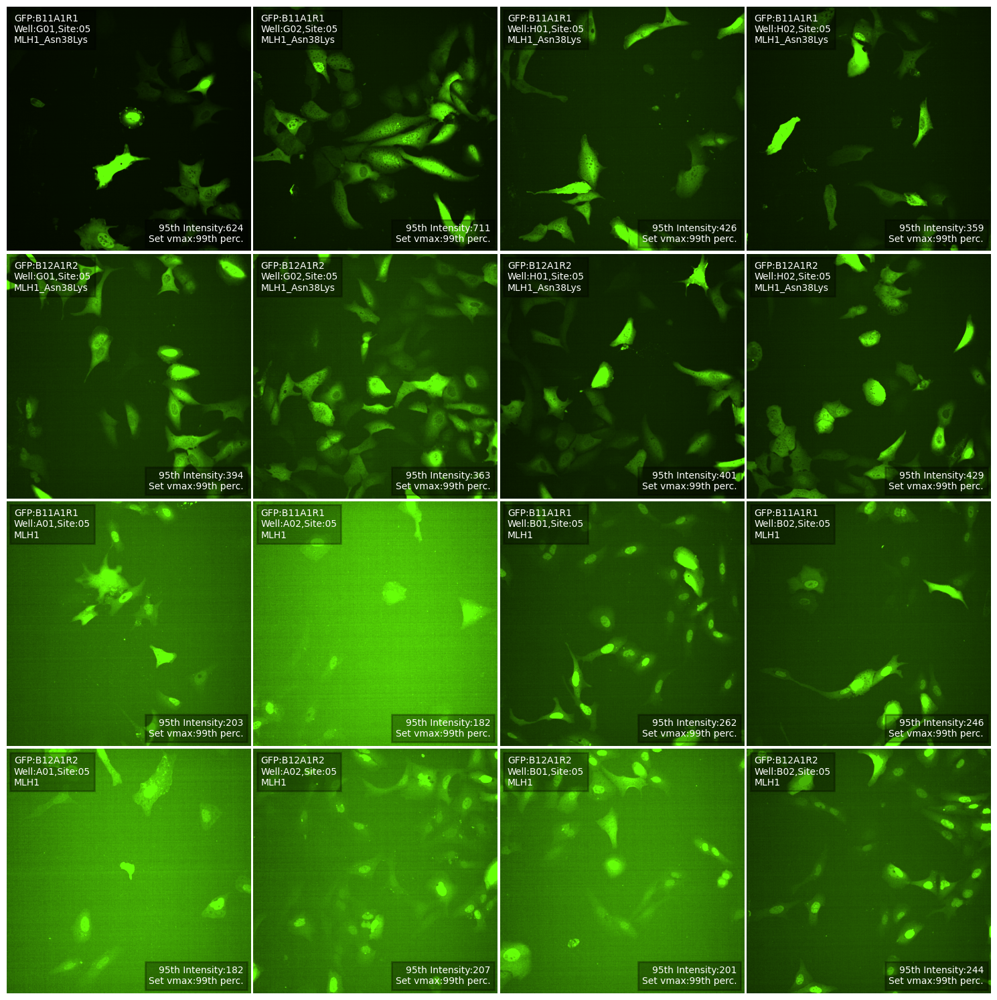

In [124]:
bio_rep, feat = "2024_12_Batch_11-12", "GFP"
out_batch_img_dir = f"{OUT_IMG_DIR}/{bio_rep}"
# os.makedirs(out_batch_img_dir)

# allele_meta_df_dict[bio_rep].filter(pl.col("gene_allele")=="MLH1_Ile36Asn").unique(subset="well_position")

plot_allele_single_plate(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                         variant="MLH1_Asn38Lys", sel_channel=feat, 
                         auroc_df=auroc_df_dict[bio_rep][feat], 
                         plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                         site="05", max_intensity=0.99, display=True, 
                         imgs_dir=TIFF_IMGS_DIR, output_dir=out_batch_img_dir)

<Figure size 640x480 with 0 Axes>

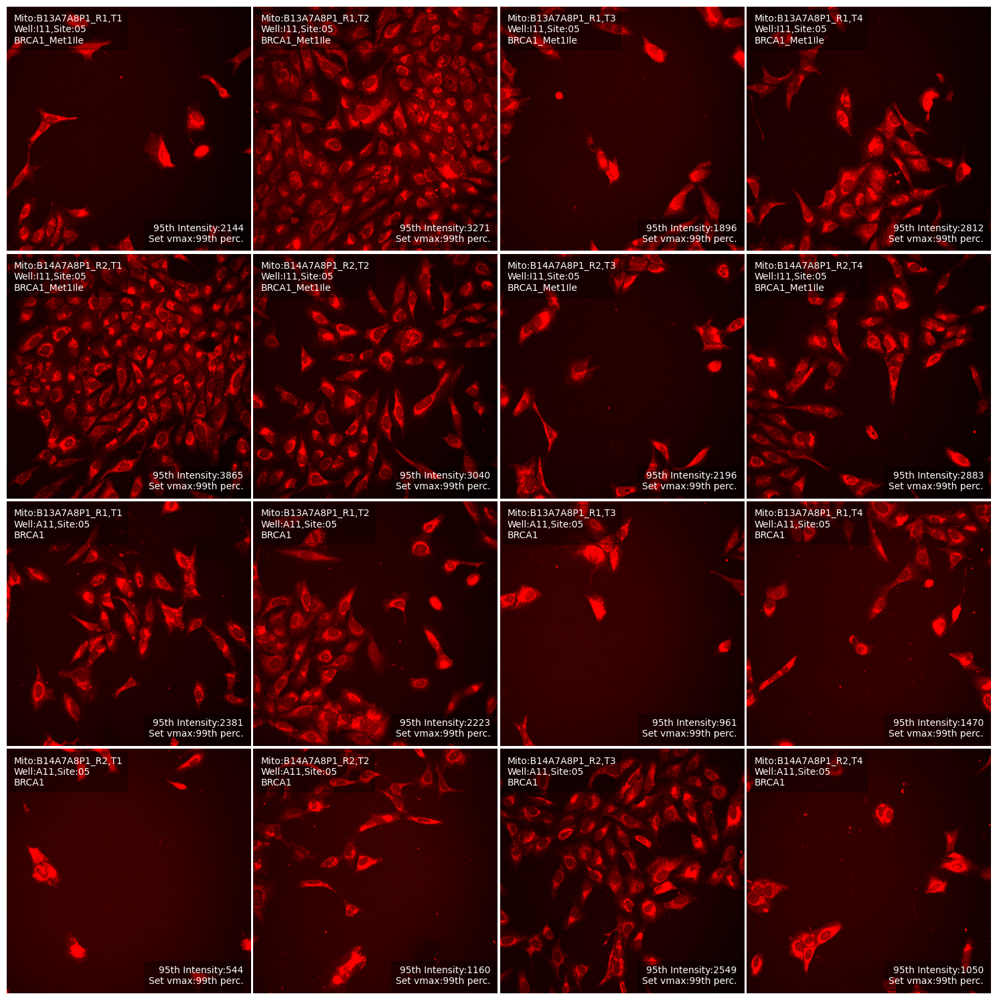

<Figure size 640x480 with 0 Axes>

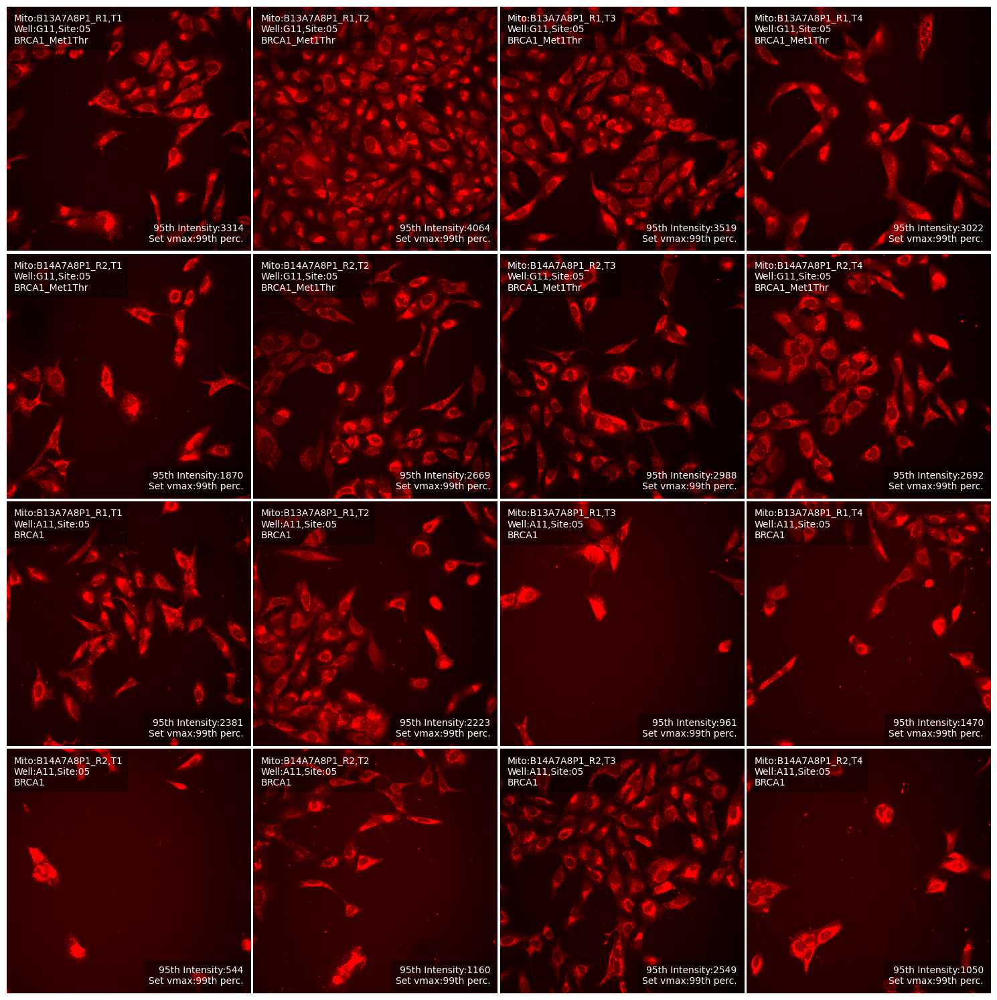

In [131]:
bio_rep, feat = "2025_01_Batch_13-14", "Mito"
out_batch_img_dir = f"{OUT_IMG_DIR}/{bio_rep}"
# os.makedirs(out_batch_img_dir)

plot_allele(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                         variant="BRCA1_Met1Ile", sel_channel=feat, 
                         auroc_df=auroc_df_dict[bio_rep][feat], 
                         # ref_well=[""],
                         plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                         site="05", max_intensity=0.99, display=True,
                         imgs_dir=TIFF_IMGS_DIR, output_dir=out_batch_img_dir)

plot_allele(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                         variant="BRCA1_Met1Thr", sel_channel=feat, 
                         auroc_df=auroc_df_dict[bio_rep][feat], 
                         # ref_well=[""],
                         plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                         site="05", max_intensity=0.99, display=True,
                         imgs_dir=TIFF_IMGS_DIR, output_dir=out_batch_img_dir)

In [84]:
img_files = [f for f in os.listdir(out_batch_img_dir)]
for gene_allele in auroc_df_dict[bio_rep]["GFP"].filter(pl.col("allele_0").str.contains("MLH1"))["allele_0"]:
    gene_file = [gene for gene in img_files if gene_allele in gene]
    if not gene_file:
        if gene_allele == "MLH1_Ile36Asn":
            plot_allele_single_plate(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                                     variant=gene_allele, sel_channel=feat, 
                                     auroc_df=auroc_df_dict[bio_rep][feat], 
                                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                                     site="05", max_intensity=0.99, display=False,
                                     var_well=["K01","K01","L01","L02"],
                                     imgs_dir=TIFF_IMGS_DIR, 
                                     output_dir=out_batch_img_dir)
        else:
            plot_allele_single_plate(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                                     variant=gene_allele, sel_channel=feat, 
                                     auroc_df=auroc_df_dict[bio_rep][feat], 
                                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                                     site="05", max_intensity=0.99, display=False,
                                     # var_well=["K01","K01","L01","L02"],
                                     imgs_dir=TIFF_IMGS_DIR, 
                                     output_dir=out_batch_img_dir)

## 3. Plot Cells

In [132]:
bio_rep = "2025_01_Batch_13-14"

In [133]:
BATCH_PROFILES = "../2.snakemake_pipeline/outputs/batch_profiles/{}/profiles.parquet" 
IMG_ANALYSIS_DIR = "../1.image_preprocess_qc/inputs/cpg_imgs/{}/analysis"
OUT_CELL_DIR = f"../2.snakemake_pipeline/outputs/visualize_cells/{bio_rep}"
# os.mkdir(OUT_CELL_DIR)

In [134]:
# Filter thresholds
min_area_ratio = 0.15
max_area_ratio = 0.3
min_center = 50
max_center = 1030

# num_mad = 5
# min_cells = 250

batch_profiles = {}
for batch_id in BIO_REP_BATCHES_DICT[bio_rep]:
    imagecsv_dir = IMG_ANALYSIS_DIR.format(batch_id) #f"../../../8.1_upstream_analysis_runxi/2.raw_img_qc/inputs/images/{batch_id}/analysis"
    prof_path = BATCH_PROFILES.format(batch_id)
    # Get metadata
    profiles = pl.scan_parquet(prof_path).select(
        ["Metadata_well_position", "Metadata_plate_map_name", "Metadata_ImageNumber", "Metadata_ObjectNumber",
        "Metadata_symbol", "Metadata_gene_allele", "Metadata_node_type", "Metadata_Plate",
        "Nuclei_AreaShape_Area", "Cells_AreaShape_Area", "Nuclei_AreaShape_Center_X", "Nuclei_AreaShape_Center_Y",
        "Cells_AreaShape_BoundingBoxMaximum_X", "Cells_AreaShape_BoundingBoxMaximum_Y", "Cells_AreaShape_BoundingBoxMinimum_X",
        "Cells_AreaShape_BoundingBoxMinimum_Y",	"Cells_AreaShape_Center_X",	"Cells_AreaShape_Center_Y",
        "Cells_Intensity_MeanIntensity_GFP", "Cells_Intensity_MedianIntensity_GFP", "Cells_Intensity_IntegratedIntensity_GFP"],
    ).collect()
    # print(profiles["Metadata_Plate"])
    # break

    # Filter based on cell to nucleus area
    profiles = profiles.with_columns(
                    (pl.col("Nuclei_AreaShape_Area")/pl.col("Cells_AreaShape_Area")).alias("Nucleus_Cell_Area"),
                    pl.concat_str([
                        "Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber", "Metadata_ObjectNumber",
                        ], separator="_").alias("Metadata_CellID"),
            ).filter((pl.col("Nucleus_Cell_Area") > min_area_ratio) & (pl.col("Nucleus_Cell_Area") < max_area_ratio))

    # Filter cells too close to image edge
    profiles = profiles.filter(
        ((pl.col("Nuclei_AreaShape_Center_X") > min_center) & (pl.col("Nuclei_AreaShape_Center_X") < max_center) &
        (pl.col("Nuclei_AreaShape_Center_Y") > min_center) & (pl.col("Nuclei_AreaShape_Center_Y") < max_center)),
    )

    # Calculate mean, median and mad of gfp intensity for each allele
    ## mean
    means = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Cells_Intensity_MeanIntensity_GFP").mean().alias("WellIntensityMean"),
    )
    profiles = profiles.join(means, on=["Metadata_Plate", "Metadata_well_position"])
    ## median
    medians = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Cells_Intensity_MedianIntensity_GFP").median().alias("WellIntensityMedian"),
    )
    profiles = profiles.join(medians, on=["Metadata_Plate", "Metadata_well_position"])
    ## mad
    profiles = profiles.with_columns(
        (pl.col("Cells_Intensity_MedianIntensity_GFP") - pl.col("WellIntensityMedian")).abs().alias("Abs_dev"),
    )
    mad = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Abs_dev").median().alias("Intensity_MAD"),
    )
    profiles = profiles.join(mad, on=["Metadata_Plate", "Metadata_well_position"])

    # Threshold is 5X
    # Used to be median well intensity + 5*mad implemented by Jess
    # Switching to mean well intensity + 5*mad implemented by Runxi
    # profiles = profiles.with_columns(
    #     (pl.col("WellIntensityMedian") + num_mad*pl.col("Intensity_MAD")).alias("Intensity_upper_threshold"), ## pl.col("WellIntensityMedian")
    #     (pl.col("WellIntensityMedian") - num_mad*pl.col("Intensity_MAD")).alias("Intensity_lower_threshold"), ## pl.col("WellIntensityMedian")
    # )
    # ## Filter by intensity MAD
    # profiles = profiles.filter(
    #     pl.col("Cells_Intensity_MeanIntensity_GFP") <= pl.col("Intensity_upper_threshold"),
    # ).filter(
    #     pl.col("Cells_Intensity_MeanIntensity_GFP") >= pl.col("Intensity_lower_threshold"),
    # )

    # Filter out alleles with fewer than 250 cells
    # keep_alleles = profiles.group_by("Metadata_gene_allele").count().filter(
    #     pl.col("count") >= min_cells,
    #     ).select("Metadata_gene_allele").to_series().to_list()
    # profiles = profiles.filter(pl.col("Metadata_gene_allele").is_in(keep_alleles))

    # add full crop coordinates
    profiles = profiles.with_columns(
        (pl.col("Nuclei_AreaShape_Center_X") - 50).alias("x_low").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_X") + 50).alias("x_high").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_Y") - 50).alias("y_low").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_Y") + 50).alias("y_high").round().cast(pl.Int16),
    )

    # Read in all Image.csv to get ImageNumber:SiteNumber mapping and paths
    image_dat = []
    icfs = glob.glob(os.path.join(imagecsv_dir, "**/*Image.csv"), recursive=True)
    for icf in tqdm(icfs):
        fp = icf.split('/')[-2]
        # print(fp)
        plate, well = "-".join(fp.split("-")[:-2]), fp.split("-")[-2]
        # print(plate, well)
        image_dat.append(pl.read_csv(icf).select(
            [
                "ImageNumber",
                "Metadata_Site",
                "PathName_OrigDNA",
                "FileName_OrigDNA",
                "FileName_OrigGFP",
                ],
            ).with_columns(
            pl.lit(plate).alias("Metadata_Plate"),
            pl.lit(well).alias("Metadata_well_position"),
            ))
    image_dat = pl.concat(image_dat).rename({"ImageNumber": "Metadata_ImageNumber"})

    # Create useful filepaths
    image_dat = image_dat.with_columns(
        pl.col("PathName_OrigDNA").str.replace(".*cpg0020-varchamp/", "").alias("Path_root"),
    )

    image_dat = image_dat.drop([
        "PathName_OrigDNA",
        "FileName_OrigDNA",
        "FileName_OrigGFP",
        "Path_root",
    ])
    # print(image_dat)

    # Append to profiles
    profiles = profiles.join(image_dat, on = ["Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber"])

    # Sort by allele, then image number
    profiles = profiles.with_columns(
        pl.concat_str(["Metadata_Plate", "Metadata_well_position", "Metadata_Site"], separator="_").alias("Metadata_SiteID"),
        pl.col("Metadata_gene_allele").str.replace("_", "-").alias("Protein_label"),
    )
    profiles = profiles.sort(["Protein_label", "Metadata_SiteID"])
    alleles = profiles.select("Protein_label").to_series().unique().to_list()

    batch_profiles[batch_id] = profiles

100%|██████████| 27647/27647 [00:54<00:00, 509.73it/s]


In [16]:
def crop_allele(allele: str, profile_df: pl.DataFrame, meta_plate: str, rep: str="", well: str="", site: str="5") -> None:
    """Crop images and save metadata as numpy arrays for one allele.

    Parameters
    ----------
    allele : String
        Name of allele to process
    profile_df : String
        Dataframe with pathname and cell coordinates
    img_dir : String
        Directory where all images are stored
    out_dir : String
        Directory where numpy arrays should be saved
    """
    if rep:
        allele_df = profile_df.filter(
            (pl.col("Metadata_gene_allele")==allele) &
            (pl.col("Metadata_Site")==int(site)) &
            (pl.col("Metadata_plate_map_name").str.contains(meta_plate)) &
            (pl.col("Metadata_Plate").str.contains(rep))
        )
        
    if well:
        allele_df = profile_df.filter(
            (pl.col("Metadata_gene_allele")==allele) &
            (pl.col("Metadata_Site")==int(site)) &
            (pl.col("Metadata_plate_map_name").str.contains(meta_plate)) &
            (pl.col("Metadata_well_position").str.contains(well))
        )
    return allele_df


# Compute distances from edges and find the most centered well
def compute_distance_cell(row, col, edge=1080):
    return min(row - 1, edge - row, col - 1, edge - col)  # Distance from nearest edge


allele_df = crop_allele("MLH1", batch_profiles["2024_12_09_Batch_11"], "B11A1R1_P1", well="A01", site="5")
allele_df

Metadata_well_position,Metadata_plate_map_name,Metadata_ImageNumber,Metadata_ObjectNumber,Metadata_symbol,Metadata_gene_allele,Metadata_node_type,Metadata_Plate,Nuclei_AreaShape_Area,Cells_AreaShape_Area,Nuclei_AreaShape_Center_X,Nuclei_AreaShape_Center_Y,Cells_AreaShape_BoundingBoxMaximum_X,Cells_AreaShape_BoundingBoxMaximum_Y,Cells_AreaShape_BoundingBoxMinimum_X,Cells_AreaShape_BoundingBoxMinimum_Y,Cells_AreaShape_Center_X,Cells_AreaShape_Center_Y,Cells_Intensity_MeanIntensity_GFP,Cells_Intensity_MedianIntensity_GFP,Cells_Intensity_IntegratedIntensity_GFP,Nucleus_Cell_Area,Metadata_CellID,WellIntensityMean,WellIntensityMedian,Abs_dev,Intensity_MAD,x_low,x_high,y_low,y_high,Metadata_Site,Metadata_SiteID,Protein_label
str,str,i64,i64,str,str,str,str,i64,i64,f64,f64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,str,f64,f64,f64,f64,i16,i16,i16,i16,i64,str,str
"""A01""","""B11A1R1_P1""",5,17,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1520,6975,736.373026,882.398684,787,927,653,810,710.978925,881.668387,0.001952,0.001768,13.614451,0.217921,"""2024-12-09_B11A1R1_A01_5_17""",0.002195,0.001802,0.000034,0.00015,686,786,832,932,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,8,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1153,6553,531.3183,414.937554,619,446,497,335,558.294674,394.728826,0.002362,0.002123,15.48141,0.17595,"""2024-12-09_B11A1R1_A01_5_8""",0.002195,0.001802,0.000322,0.00015,481,581,365,465,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,6,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",2605,15653,450.5881,330.753935,533,397,325,233,429.945186,322.950361,0.002946,0.002727,46.119936,0.166422,"""2024-12-09_B11A1R1_A01_5_6""",0.002195,0.001802,0.000925,0.00015,401,501,281,381,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,20,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1170,6913,588.145299,1021.436752,636,1080,356,760,537.031969,960.594677,0.001805,0.001707,12.476592,0.169246,"""2024-12-09_B11A1R1_A01_5_20""",0.002195,0.001802,0.000095,0.00015,538,638,971,1071,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,13,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1229,4349,356.948739,514.63629,408,553,280,487,342.757415,513.672338,0.002872,0.002674,12.489561,0.282594,"""2024-12-09_B11A1R1_A01_5_13""",0.002195,0.001802,0.000872,0.00015,307,407,465,565,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""A01""","""B11A1R1_P1""",5,14,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1792,6301,692.438058,685.168527,755,740,629,630,690.219806,683.655928,0.003807,0.003219,23.988106,0.284399,"""2024-12-09_B11A1R1_A01_5_14""",0.002195,0.001802,0.001417,0.00015,642,742,635,735,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,18,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1272,6095,642.116352,1002.96305,696,1072,614,916,652.480722,989.701395,0.00259,0.002272,15.785142,0.208696,"""2024-12-09_B11A1R1_A01_5_18""",0.002195,0.001802,0.000471,0.00015,592,692,953,1053,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""
"""A01""","""B11A1R1_P1""",5,15,"""MLH1""","""MLH1""","""disease_wt""","""2024-12-09_B11A1R1""",1159,4732,866.2761,762.315789,948,793,833,701,893.568047,743.923077,0.001576,0.001532,7.457549,0.244928,"""2024-12-09_B11A1R1_A01_5_15""",0.002195,0.001802,0.00027,0.00015,816,916,712,812,5,"""2024-12-09_B11A1R1_A01_5""","""MLH1"""


In [135]:
def plot_allele_cell(pm, variant, sel_channel, auroc_df, plate_img_qc, site="05", ref_well=[], var_well=[], max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, output_dir=""):
    cmap = channel_to_cmap(sel_channel)
    channel = channel_dict[sel_channel]
    auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()

    # if os.path.exists(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png")):
    #     print(f"Image for {variant} already exists.")
        # return None

    ## get the number of wells/images per allele
    wt = variant.split("_")[0]
    wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
    var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
    plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()

    # if len(wt_wells) > 1:
    #     # Get coordinates of wells
    #     well_coords = [well_to_coordinates(w) for w in set([ref_well_pl for ref_well_pl in wt_wells])]
    #     # Sort wells by max distance from edges (descending)
    #     wt_wells = [max(well_coords, key=lambda x: compute_distance(x[1], x[2]))[0]]

    if ref_well:
        wt_wells = [well for well in wt_wells if well in ref_well]
    if var_well:
        var_wells = [well for well in var_wells if well in var_well]

    pm_var = pm.filter((pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))&(pl.col("plate_map_name").is_in(plate_map))).sort("node_type")
    # print(pm_var)
    plt.clf()

    fig, axes = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    # fig2, axes2 = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    for wt_var, pm_row in enumerate(pm_var.iter_rows(named=True)):
        # print(pm_row)
        if pm_row["node_type"] == "allele":
            well = var_wells[0]
            allele = variant
        else:
            well = wt_wells[0]
            allele = wt

        for i in range(8):
            plot_idx = i+wt_var*4*2
            if i < 4:
                sel_plate = pm_row["imaging_plate_R1"]
            else:
                sel_plate = pm_row["imaging_plate_R2"]
                
            batch = batch_dict[sel_plate.split("_")[0]]
            batch_img_dir = f'{imgs_dir}/{batch}/images'
            letter = well[0]
            row = letter_dict[letter]
            col = well[1:3]
            
            # print(i, allele, well)
            plate_img_dir = plate_dict[sel_plate][f"T{i%4+1}"]
            img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"
            img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
            # print(np.percentile(img, 99) / np.median(img), np.percentile(img, 99) / np.percentile(img, 25))
            if plate_img_qc is not None:
                is_bg = plate_img_qc.filter((pl.col("plate") == plate_img_dir.split("__")[0]) & (pl.col("well") == well) & (pl.col("channel") == sel_channel))["is_bg"].to_numpy()[0]
                
            ## Full images
            # axes2.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
            # plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
            # axes2.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
            #         verticalalignment='top', horizontalalignment='left', transform=axes2.flatten()[plot_idx].transAxes,
            #         bbox=dict(facecolor='black', alpha=0.3, linewidth=2))

            ## Draw cells
            cell_allele_coord_df = crop_allele(allele, batch_profiles[batch], sel_plate.split("P")[0], rep=f"T{i%4+1}", site=site[-1])
            # if (cell_allele_coord_df.is_empty()):
            #     print(batch, allele, sel_plate, f"T{i%4+1}")
            #     print(cell_allele_coord_df)            
            cell_allele_coord_df = cell_allele_coord_df.with_columns(
                pl.struct("Cells_AreaShape_Center_X", "Cells_AreaShape_Center_Y") # 'Nuclei_AreaShape_Center_X', 'Nuclei_AreaShape_Center_Y'
                .map_elements(lambda x: compute_distance_cell(x['Cells_AreaShape_Center_X'], x['Cells_AreaShape_Center_Y']), return_dtype=pl.Float32).cast(pl.Int16)
                .alias('dist2edge')
            ).sort(by=["dist2edge","Cells_AreaShape_Area"], descending=[True,True]).filter(pl.col("Cells_AreaShape_Area")>5000)

            if cell_allele_coord_df.is_empty():
                axes.flatten()[plot_idx].text(0.97, 0.97, "No high-quality\ncell available", color='black', fontsize=12,
                    verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                    bbox=dict(facecolor='white', alpha=0.3, linewidth=2)
                )
                # axes.flatten()[plot_idx].set_visible(False)
                x, y = img.shape[0] // 2, img.shape[1] // 2
                img_sub = img[
                    y-112:y+112, x-112:x+112
                ]
                axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
            else:
                plot_yet = 0
                flag = False
                for cell_idx, cell_row in enumerate(cell_allele_coord_df.head(10).iter_rows(named=True)):
                    if plot_yet:
                        break
                    x, y = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
                    # x, y = int(cell_allele_coord_df["Cells_AreaShape_Center_X"].to_numpy()[0]), int(cell_allele_coord_df["Cells_AreaShape_Center_Y"].to_numpy()[0])
                    ## flip the x and y for visualization
                    img_sub = img[
                        y-112:y+112, x-112:x+112
                    ]
                    ## skip the subimage due to poor cell quality
                    if img_sub.shape[0] == 0 or img_sub.shape[1] == 0 or np.percentile(img_sub, 90) <= np.median(img) or np.var(img_sub) < 1e4:
                        flag = True
                    axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
                    plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
                    axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
                            verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    if is_bg:
                        axes.flatten()[plot_idx].text(0.03, 0.03, "FLAG:\nOnly Background\nNoise is Detected", color='red', fontsize=10,
                            verticalalignment='bottom', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                    if flag:
                        axes.flatten()[plot_idx].text(0.97, 0.97, "Poor Quality FLAG", color='red', fontsize=10,
                            verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                    int_95 = str(int(round(np.percentile(img_sub, 95))))
                    axes.flatten()[plot_idx].text(0.95, 0.05, f"95th Intensity:{int_95}", color='white', fontsize=10,
                                verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                                bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    plot_yet = 1
                    
            axes.flatten()[plot_idx].axis("off")
                # axes.flatten()[plot_idx].set_visible(False)
                # x_min, y_min, x_max, y_max = int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_Y"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_Y"].to_numpy()[0])
                # print(x_min, y_min, x_max, y_max)
            #     for cell_idx, cell_row in enumerate(cell_allele_coord_df.head().iter_rows(named=True)):
            #         x_nuc, y_nuc = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
            #         # Create a Rectangle patch
            #         rect = patches.Rectangle((x_nuc-5, y_nuc-5), 10, 10, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         rect = patches.Rectangle((x-128, y-128), 256, 256, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         # x_min, y_min, x_max, y_max = int(cell_row["Cells_AreaShape_BoundingBoxMinimum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMinimum_Y"]), \
            #         #                              int(cell_row["Cells_AreaShape_BoundingBoxMaximum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMaximum_Y"])
            #         # print(x_min, y_min, x_max, y_max)
            #         # rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=2, edgecolor='red', facecolor='none')
            #         # Add the patch to the Axes
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         break
            # int_95 = str(int(round(np.percentile(img, 95))))
            # axes2.flatten()[plot_idx].axhline(y=img.shape[1]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].axvline(x=img.shape[0]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].text(0.95, 0.05, f"95th Percentile\nIntensity:{int_95}", color='white', fontsize=12,
            #                verticalalignment='bottom', horizontalalignment='right', transform=axes2.flatten()[plot_idx].transAxes)
            # axes2.flatten()[plot_idx].axis("off")
            
    fig.tight_layout()
    fig.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
    if display:
        plt.show()

    if output_dir:
        fig.savefig(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png"), dpi=400, bbox_inches='tight')
        plt.close(fig)

In [157]:
# ref_wells = allele_meta_df_dict[bio_rep].filter(pl.col("gene_allele")=="BRCA1")["well_position"]
# ref_wells
# img_well_qc_sum_dict[bio_rep].filter((pl.col("well").is_in(ref_wells))&(pl.col("is_bg")))

well_position
str
"""A11"""


In [ ]:
kcnj2_gfp_alleles = ['KCNJ2_Arg40Gln',
 'KCNJ2_Lys364Arg',
 'KCNJ2_Ala70Ser',
 'KCNJ2_Met301Leu',
 'KCNJ2_Asn318Ser',
 'KCNJ2_Pro420Leu',
 'KCNJ2_Glu349Lys',
 'KCNJ2_Arg40Pro',
 'KCNJ2_Trp322Cys',
 'KCNJ2_Ala70Thr',
 'KCNJ2_His110Tyr',
 'KCNJ2_Val86Phe',
 'KCNJ2_Arg325Cys',
 'KCNJ2_Gly300Asp',
 'KCNJ2_Ile269Lys',
 'KCNJ2_Thr139Ile',
 'KCNJ2_Asp78Gly',
 'KCNJ2_Arg189Lys',
 'KCNJ2_Tyr326Asn',
 'KCNJ2_Asp71His',
 'KCNJ2_Thr400Met',
 'KCNJ2_Arg189Ile',
 'KCNJ2_Arg67Gln',
 'KCNJ2_Arg260Pro',
 'KCNJ2_Arg312His',
 'KCNJ2_Thr75Arg',
 'KCNJ2_Pro186Leu',
 'KCNJ2_Val93Ile',
 'KCNJ2_Arg67Trp',
 'KCNJ2_Arg82Gln',
 'KCNJ2_Thr75Met',
 'KCNJ2_Gly215Asp',
 'KCNJ2_Asp71Asn',
 'KCNJ2_Cys76Gly',
 'KCNJ2_Val302Met',
 'KCNJ2_Met301Val']

In [140]:
CCM2_alleles = ['CCM2_Tyr261Asp',
                 'CCM2_Pro102Leu',
                 'CCM2_Ser408Arg',
                 'CCM2_Pro240Leu',
                 'CCM2_Thr241Ile',
                 'CCM2_Thr44Ser',
                 'CCM2_Ile372Leu',
                 'CCM2_Glu366Lys']

for allele in CCM2_alleles:
    plot_allele_cell(allele_meta_df_dict[bio_rep], 
                     variant=allele, 
                     sel_channel="AGP", 
                     auroc_df=auroc_df_dict[bio_rep][feat], 
                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                     ref_well="M10",
                     site="05", max_intensity=0.99, display=False, 
                     imgs_dir=TIFF_IMGS_DIR, 
                     output_dir=OUT_CELL_DIR)
    plot_allele_cell(allele_meta_df_dict[bio_rep], 
                     variant=allele, 
                     sel_channel="Mito", 
                     auroc_df=auroc_df_dict[bio_rep][feat], 
                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                     ref_well="M10",
                     site="05", max_intensity=0.99, display=False, 
                     imgs_dir=TIFF_IMGS_DIR, 
                     output_dir=OUT_CELL_DIR)
    plot_allele_cell(allele_meta_df_dict[bio_rep], 
                     variant=allele, 
                     sel_channel="DAPI", 
                     auroc_df=auroc_df_dict[bio_rep][feat], 
                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                     ref_well="M10",
                     site="05", max_intensity=0.99, display=False, 
                     imgs_dir=TIFF_IMGS_DIR, 
                     output_dir=OUT_CELL_DIR)

In [154]:
ccm2_gfp_allele = ['CCM2_Arg19Gln',
                 'CCM2_Ile372Leu',
                 'CCM2_His332Arg',
                 'CCM2_Val190Met',
                 'CCM2_Gly379Ser',
                 'CCM2_Ile331Phe',
                 'CCM2_Asp376His',
                 'CCM2_Asp301Gly',
                 'CCM2_Ile425Thr',
                 'CCM2_Ile432Thr',
                 'CCM2_Arg423Pro']

# for allele in ccm2_gfp_allele:
#     plot_allele_cell(allele_meta_df_dict[bio_rep], 
#                      variant=allele, 
#                      sel_channel="GFP", 
#                      auroc_df=auroc_df_dict[bio_rep][feat], 
#                      plate_img_qc=img_well_qc_sum_dict[bio_rep], 
#                      ref_well="M10",
#                      site="05", max_intensity=0.99, display=False, 
#                      imgs_dir=TIFF_IMGS_DIR, 
#                      output_dir=OUT_CELL_DIR)

<Figure size 640x480 with 0 Axes>

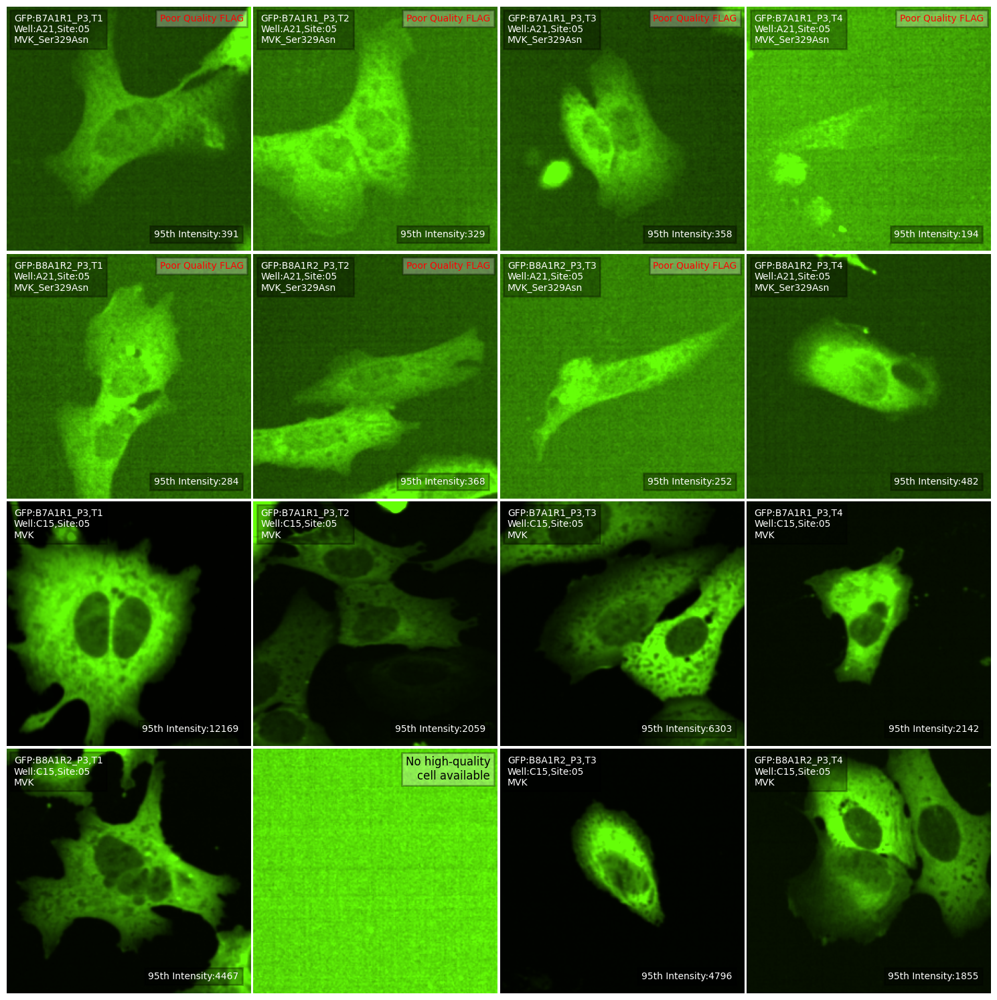

In [71]:
plot_allele_cell(allele_meta_df_dict[bio_rep], 
                 variant="MVK_Ser329Asn", sel_channel=feat, 
                 auroc_df=auroc_df_dict[bio_rep][feat], 
                 plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                 site="05", max_intensity=0.99, display=True, 
                 imgs_dir=TIFF_IMGS_DIR, output_dir="")

In [106]:
def plot_allele_cell_single_plate(pm, variant, sel_channel, plate_img_qc, auroc_df=None, site="05", ref_well=[], var_well=[], max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, output_dir=""):
    assert imgs_dir != "", "Image directory has to be input!"
    plt.clf()
    cmap = channel_to_cmap(sel_channel)
    channel = channel_dict[sel_channel]
    if auroc_df is not None:
        auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()
    else:
        auroc = ""

    ## get the number of wells/images per allele
    plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()
    wt = variant.split("_")[0]
    wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
    var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
    
    if ref_well:
        wt_wells = [well for well in wt_wells if well in ref_well]
    if var_well:
        var_wells = [well for well in var_wells if well in var_well]
    
    pm_var = pm.filter(
        (pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))
        &(pl.col("plate_map_name").is_in(plate_map))
    ).sort(by=["gene_allele", "plate_map_name", "imaging_well"],
           descending=[True, False, False])

    fig, axes = plt.subplots(4, 4, figsize=(15, 2*8), sharex=True, sharey=True)
    for plot_idx, pm_row in enumerate(pm_var.iter_rows(named=True)):
        well = pm_row["imaging_well"]
        allele = pm_row["gene_allele"]

        if plot_idx < 4 or (plot_idx >= 8 and plot_idx < 12):
            sel_plate = pm_row["imaging_plate_R1"]
        else:
            sel_plate = pm_row["imaging_plate_R2"]
            
        if "_" in sel_plate:
            batch_plate_map = sel_plate.split("_")[0]
        else:
            batch_plate_map = sel_plate
            
        batch = batch_dict[batch_plate_map]
        batch_img_dir = f'{imgs_dir}/{batch}/images'
        
        letter = well[0]
        row = letter_dict[letter]
        col = well[1:3]
        
        plate_img_dir = plate_dict[sel_plate]
        img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"
        img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
        # print(np.percentile(img, 99) / np.median(img), np.percentile(img, 99) / np.percentile(img, 25))
        if plate_img_qc is not None:
            is_bg = plate_img_qc.filter(
                (pl.col("plate") == plate_img_dir.split("__")[0])
                & (pl.col("well") == well)
                & (pl.col("channel") == sel_channel))["is_bg"].to_numpy()[0]
            
        ## Full images
        # axes2.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
        # plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
        # axes2.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
        #         verticalalignment='top', horizontalalignment='left', transform=axes2.flatten()[plot_idx].transAxes,
        #         bbox=dict(facecolor='black', alpha=0.3, linewidth=2))

        ## Draw cells
        cell_allele_coord_df = crop_allele(allele, batch_profiles[batch], sel_plate, well=well, site=site[-1])          
        cell_allele_coord_df = cell_allele_coord_df.with_columns(
            pl.struct("Cells_AreaShape_Center_X", "Cells_AreaShape_Center_Y") # 'Nuclei_AreaShape_Center_X', 'Nuclei_AreaShape_Center_Y'
            .map_elements(lambda x: compute_distance_cell(x['Cells_AreaShape_Center_X'], x['Cells_AreaShape_Center_Y']), return_dtype=pl.Float32).cast(pl.Int16)
            .alias('dist2edge')
        ).sort(by=["dist2edge","Cells_AreaShape_Area"], descending=[True,True]).filter(pl.col("Cells_AreaShape_Area")>5000)

        if cell_allele_coord_df.is_empty():
            axes.flatten()[plot_idx].text(0.97, 0.97, "No high-quality\ncell available", color='black', fontsize=12,
                verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                bbox=dict(facecolor='white', alpha=0.3, linewidth=2)
            )
            # axes.flatten()[plot_idx].set_visible(False)
            x, y = img.shape[0] // 2, img.shape[1] // 2
            img_sub = img[
                y-112:y+112, x-112:x+112
            ]
            axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
        else:
            plot_yet = 0
            flag = False
            top_20_cell_allele_coord_df = cell_allele_coord_df.head(20)
            img_subs = []
            ## go through top 20 if exists
            for cell_idx, cell_row in enumerate(top_20_cell_allele_coord_df.iter_rows(named=True)):
                if plot_yet:
                    break
                x, y = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
                # x, y = int(cell_allele_coord_df["Cells_AreaShape_Center_X"].to_numpy()[0]), int(cell_allele_coord_df["Cells_AreaShape_Center_Y"].to_numpy()[0])
                ## flip the x and y for visualization
                img_sub = img[y-112:y+112, x-112:x+112]
                img_subs.append(img_sub)

                # Check if this is a good quality cell
                is_good_quality = not (img_sub.shape[0] == 0 or img_sub.shape[1] == 0 or 
                                      np.percentile(img_sub, 90) <= np.median(img) or 
                                      np.var(img_sub) < 1e4)
                
                # If it's good quality, plot it and break
                if is_good_quality:
                    axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)
                    plot_yet = 1
                    flag = False
                # If it's the last cell and we haven't plotted anything yet, plot this poor quality one
                elif cell_idx == len(top_20_cell_allele_coord_df) - 1:
                    if (img_sub.shape[0] == 224 and img_sub.shape[1] == 224):
                        axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)
                    else:
                        img_idx = len(img_subs) - 1
                        while (img_sub.shape[0] != 224 or img_sub.shape[1] != 224) and (img_idx >= 0):
                            img_sub = img_subs[img_idx]
                            img_idx -= 1
                        try:
                            axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)
                        except:
                            # axes.flatten()[plot_idx].set_visible(False)
                            x, y = img.shape[0] // 2, img.shape[1] // 2
                            img_sub = img[
                                y-112:y+112, x-112:x+112
                            ]
                            axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)
                    plot_yet = 1
                    flag = True
                else:
                    # Continue to next cell
                    continue
                axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)    
                plot_label = f"{sel_channel}:{sel_plate},\nWell:{well},Site:{site}\n{allele}"
                axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
                        verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                        bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                if is_bg:
                    axes.flatten()[plot_idx].text(0.03, 0.03, "FLAG:\nOnly Background\nNoise is Detected", color='red', fontsize=10,
                        verticalalignment='bottom', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                        bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                if flag:
                    axes.flatten()[plot_idx].text(0.97, 0.97, "Poor Quality FLAG", color='red', fontsize=10,
                        verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                        bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                int_95 = str(int(round(np.percentile(img_sub, 95))))
                axes.flatten()[plot_idx].text(0.95, 0.05, f"95th Intensity:{int_95}", color='white', fontsize=10,
                            verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                plot_yet = 1
                
        axes.flatten()[plot_idx].axis("off")
            
    fig.tight_layout()
    fig.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
    if display:
        plt.show()

    if output_dir:
        fig.savefig(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png"), dpi=400, bbox_inches='tight')
        plt.close(fig)

<Figure size 640x480 with 0 Axes>

<Figure size 1500x1600 with 0 Axes>

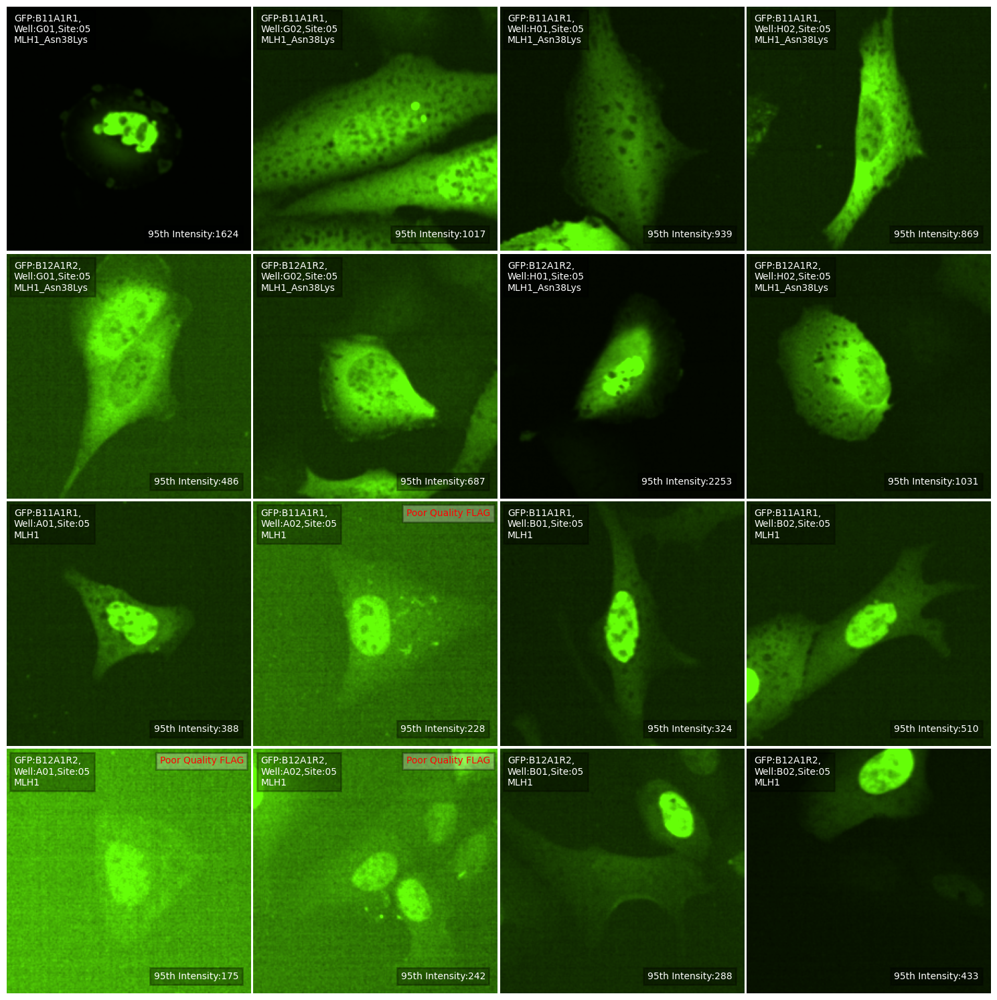

In [99]:
plot_allele_cell_single_plate(allele_meta_df_dict[bio_rep], 
                              variant="MLH1_Asn38Lys", sel_channel=feat, 
                              auroc_df=auroc_df_dict[bio_rep][feat], 
                              plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                              site="05", max_intensity=0.99, display=True, 
                              imgs_dir=TIFF_IMGS_DIR, 
                              output_dir=OUT_CELL_DIR)

In [107]:
cell_img_files = [f for f in os.listdir(OUT_CELL_DIR)]
for gene_allele in auroc_df_dict[bio_rep]["GFP"].filter(pl.col("allele_0").str.contains("MLH1"))["allele_0"]:
    gene_file = [] #[gene for gene in cell_img_files if gene_allele in gene]
    if not gene_file:
        if gene_allele == "MLH1_Ile36Asn":
            plot_allele_cell_single_plate(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                                     variant=gene_allele, sel_channel=feat, 
                                     auroc_df=auroc_df_dict[bio_rep][feat], 
                                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                                     site="05", max_intensity=0.99, display=False,
                                     var_well=["K01","K01","L01","L02"],
                                     imgs_dir=TIFF_IMGS_DIR, 
                                     output_dir=out_batch_img_dir)
        else:
            plot_allele_cell_single_plate(allele_meta_df_dict[bio_rep], ##.filter(pl.col("plate_map_name").str.contains("B13")
                                     variant=gene_allele, sel_channel=feat, 
                                     auroc_df=auroc_df_dict[bio_rep][feat], 
                                     plate_img_qc=img_well_qc_sum_dict[bio_rep], 
                                     site="05", max_intensity=0.99, display=False,
                                     # var_well=["K01","K01","L01","L02"],
                                     imgs_dir=TIFF_IMGS_DIR, 
                                     output_dir=out_batch_img_dir)